In [1]:
%pip install -U langchain langchain-community faiss-cpu langchain-ollama python-dotenv docling numpy==1.26

  Using cached langchain_community-0.3.22-py3-none-any.whl.metadata (2.4 kB)
INFO: pip is looking at multiple versions of langchain-community to determine which version is compatible with other requirements. This could take a while.
  Using cached langchain_community-0.3.21-py3-none-any.whl.metadata (2.4 kB)
  Using cached langchain_community-0.3.20-py3-none-any.whl.metadata (2.4 kB)
  Using cached langchain_community-0.3.19-py3-none-any.whl.metadata (2.4 kB)
  Using cached langchain_community-0.3.18-py3-none-any.whl.metadata (2.4 kB)
  Using cached langchain_community-0.3.17-py3-none-any.whl.metadata (2.4 kB)
  Using cached langchain_community-0.3.16-py3-none-any.whl.metadata (2.9 kB)
  Using cached langchain_community-0.3.15-py3-none-any.whl.metadata (2.9 kB)
INFO: pip is still looking at multiple versions of langchain-community to determine which version is compatible with other requirements. This could take a while.
  Using cached langchain_community-0.3.14-py3-none-any.whl.metadat

In [2]:
#Environment Setup
from dotenv import load_dotenv
import os
import warnings
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
warnings.filterwarnings("ignore")
load_dotenv()

True

In [3]:
import faiss
from langchain_community.docstore.in_memory import InMemoryDocstore
from langchain_community.vectorstores import FAISS

from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.runnables import RunnablePassthrough

from langchain_text_splitters import MarkdownHeaderTextSplitter

from langchain_ollama import ChatOllama, OllamaEmbeddings

from docling.document_converter import DocumentConverter

In [4]:
import json
import os

def table_to_markdown(table):
    """Convert a JSON table (list of lists) to a Markdown table."""
    if not table:
        return ""
    
    markdown_lines = []
    header_row = table[0]
    cleaned_header = [str(cell) if cell is not None else "" for cell in header_row]
    markdown_lines.append("| " + " | ".join(cleaned_header) + " |")
    markdown_lines.append("| " + " | ".join(["---"] * len(cleaned_header)) + " |")
    
    for row in table[1:]:
        cleaned_row = [str(cell) if cell is not None else "" for cell in row]
        markdown_lines.append("| " + " | ".join(cleaned_row) + " |")
    
    return "\n".join(markdown_lines)

def qa_to_markdown(qa):
    """Convert the qa field to a Markdown section."""
    if not qa:
        return ""
    
    question = qa.get("question", "")
    answer = qa.get("answer", "")
    explanation = qa.get("explanation", "")
    steps = qa.get("steps", [])
    
    markdown = ["### Question-Answer", f"- **Question**: {question}", f"- **Answer**: {answer}"]
    
    if explanation:
        markdown.append(f"- **Explanation**: {explanation}")
    
    if steps:
        markdown.append("- **Calculation Steps**:")
        for step in steps:
            op = step.get("op", "")
            arg1 = step.get("arg1", "")
            arg2 = step.get("arg2", "")
            res = step.get("res", "")
            markdown.append(f"  - {op}: {arg1}, {arg2} → {res}")
    
    return "\n".join(markdown)

def json_to_markdown(json_data, output_file):
    """Convert JSON data to a Markdown file."""
    markdown_content = ["", ""]
    
    for entry in json_data:
        entry_id = entry.get("id", "Unknown ID")
        filename = entry.get("filename", "Unknown File")
        markdown_content.append(f"# Entry: {entry_id} ({filename})")
        markdown_content.append("")
        
        pre_text = entry.get("pre_text", [])
        if pre_text:
            markdown_content.append("## Pre-Text")
            markdown_content.append(" ".join(pre_text))
            markdown_content.append("")
        
        table = entry.get("table", [])
        if table:
            markdown_content.append("## Table")
            markdown_content.append(table_to_markdown(table))
            markdown_content.append("")
        
        post_text = entry.get("post_text", [])
        if post_text:
            markdown_content.append("## Post-Text")
            markdown_content.append(" ".join(post_text))
            markdown_content.append("")
        
        qa = entry.get("qa", {})
        if qa:
            markdown_content.append(qa_to_markdown(qa))
            markdown_content.append("")
        
        annotation = entry.get("annotation", {})
        if annotation:
            markdown_content.append("## Annotation")
            for key, value in annotation.items():
                markdown_content.append(f"- **{key}**: {value}")
            markdown_content.append("")
        
        markdown_content.append("---")
        markdown_content.append("")
    
    with open(output_file, "w", encoding="utf-8") as f:
        f.write("\n".join(markdown_content))
    print(f"Markdown file saved as: {output_file}")

def main():
    input_file = "data/train.json"
    output_file = "data/train_output.md"
    
    if not os.path.exists(input_file):
        print(f"Error: {input_file} not found.")
        return
    
    try:
        with open(input_file, "r", encoding="utf-8") as f:
            json_data = json.load(f)
    except json.JSONDecodeError as e:
        print(f"Error: Failed to parse {input_file}. {e}")
        return
    
    json_to_markdown(json_data, output_file)

if __name__ == "__main__":
    main()

Markdown file saved as: data/train_output.md


In [5]:
import os
from langchain_text_splitters import MarkdownHeaderTextSplitter

def load_markdown_document(file_path):
    """Read the content of a Markdown file."""
    try:
        with open(file_path, "r", encoding="utf-8") as f:
            return f.read()
    except FileNotFoundError:
        print(f"Error: {file_path} not found.")
        return None
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return None

def get_markdown_splits(markdown_content):
    """Split Markdown content into chunks based on headers."""
    headers_to_split_on = [("#", "Header 1"), ("##", "Header 2"), ("###", "Header 3")]
    #headers_to_split_on = [("#", "Header 1")]
    markdown_splitter = MarkdownHeaderTextSplitter(headers_to_split_on, strip_headers=False)
    return markdown_splitter.split_text(markdown_content)



# File path for the Markdown file
markdown_file = "data/train_output.md"

# Load Markdown content
markdown_content = load_markdown_document(markdown_file)

# Split into chunks
chunks = get_markdown_splits(markdown_content)

# Print chunks for inspection
print(f"Total chunks: {len(chunks)}\n")
for i, chunk in enumerate(chunks):
    print(f"Chunk {i + 1}:")
    print(f"Metadata: {chunk.metadata}")
    print(f"Content (first 500 characters):\n{chunk.page_content[:500]}...")
    print("-" * 50)



Total chunks: 14257

Chunk 1:
Metadata: {'Header 1': 'Entry: Single_JKHY/2009/page_28.pdf-3 (JKHY/2009/page_28.pdf)', 'Header 2': 'Pre-Text'}
Content (first 500 characters):
# Entry: Single_JKHY/2009/page_28.pdf-3 (JKHY/2009/page_28.pdf)  
## Pre-Text
26 | 2009 annual report in fiscal 2008 , revenues in the credit union systems and services business segment increased 14% ( 14 % ) from fiscal 2007 . all revenue components within the segment experienced growth during fiscal 2008 . license revenue generated the largest dollar growth in revenue as episys ae , our flagship core processing system aimed at larger credit unions , experienced strong sales throughout the year...
--------------------------------------------------
Chunk 2:
Metadata: {'Header 1': 'Entry: Single_JKHY/2009/page_28.pdf-3 (JKHY/2009/page_28.pdf)', 'Header 2': 'Table'}
Content (first 500 characters):
## Table
| 2008 | year ended june 30 2009 2008 | year ended june 30 2009 2008 | year ended june 30 2009 |
| --- | --- | -

In [6]:
def setup_vector_store(chunks):
    embeddings = OllamaEmbeddings(model='nomic-embed-text', base_url="http://localhost:11434")
    single_vector = embeddings.embed_query("this is some text data")
    index = faiss.IndexFlatL2(len(single_vector))
    vector_store = FAISS(
        embedding_function=embeddings,
        index=index,
        docstore=InMemoryDocstore(),
        index_to_docstore_id={}
    )

    vector_store.add_documents(documents=chunks)
    return vector_store

In [19]:
vector_store = setup_vector_store(chunks)
retriever = vector_store.as_retriever(search_type="mmr", search_kwargs={'k':1})



In [18]:
vector_store.index.ntotal, len(chunks)

(14257, 14257)

In [9]:
docs = retriever.invoke("what was the percentage change in the net cash from operating activities from 2008 to 2009")
docs

[Document(metadata={'Header 1': 'Entry: Single_JKHY/2009/page_28.pdf-3 (JKHY/2009/page_28.pdf)', 'Header 2': 'Post-Text', 'Header 3': 'Question-Answer'}, page_content='### Question-Answer\n- **Question**: what was the percentage change in the net cash from operating activities from 2008 to 2009\n- **Answer**: 14.1%\n- **Calculation Steps**:\n- minus2-1: 206588, 181001 → 25587\n- divide2-2: #0, 181001 → 14.1%')]

In [10]:
def format_docs(docs):
    return  "\n\n".join([doc.page_content for doc in docs])

content = format_docs(docs)

In [11]:
print (content)

### Question-Answer
- **Question**: what was the percentage change in the net cash from operating activities from 2008 to 2009
- **Answer**: 14.1%
- **Calculation Steps**:
- minus2-1: 206588, 181001 → 25587
- divide2-2: #0, 181001 → 14.1%


In [17]:
## Setting up the RAG Chain
def create_rag_chain(retriever):
    prompt = """
          You are an assistant for question-answering tasks. Use the following pieces of retrieved content to answer the question.
          If you don't know the answer, just say that you don't know.
          Answer in bullet points. Make sure your answer is relevant to the question and it is answered from context.
          Question: {question}
          Context: {context}
          Answer:
    """
    model = ChatOllama(model="deepseek-r1:1.5b", base_url="http://localhost:11434")
    prompt_template = ChatPromptTemplate.from_template(prompt)

    chain = (
        {"context": retriever | format_docs, "question": RunnablePassthrough()}
        | prompt_template
        | model
        | StrOutputParser()
    )
    return chain

In [21]:
# ### Put Everything together
# source = "data/train.json"
# markdown_output = "data/train.md"
# json_to_markdown(source,markdown_output)
# markdown_content = load_markdown_document(markdown_output)
# chunks = get_markdown_splits(markdown_content)
# vector_store = setup_vector_store(chunks)
# retriever = vector_store.as_retriever(search_type="mmr", search_kwags={'k': 3})

# rag_chain =create_rag_chain(retriever)
question = "what was the percentage change in the net cash from operating activities from 2008 to 2009"

print(f"Question: {question}")
rag_chain = create_rag_chain(retriever)
for chunk in rag_chain.stream(question):
    print(chunk, end="",flush=True)
print("\n" + "-" *  50 + "\n")


Question: what was the percentage change in the net cash from operating activities from 2008 to 2009
<think>
Okay, so the user is asking about the percentage change in net cash from operating activities from 2008 to 2009. I remember that they provided a context with an answer and some steps. Let me go through it step by step.

First, looking at the context, there's a calculation where they subtracted 2-1: 206588 minus 181001 equals 25587. Then, to find the percentage change, I think you divide that difference by 206588 (which is the older amount) and then multiply by 100 to get a percentage. So 25587 divided by 206588 gives approximately 14.1%.

Wait, but where does "minus2-1" come from? I think that's probably referring to comparing two years' net cash flows. Let me double-check the numbers: yes, 206588 is the earlier year and 181001 is the later year. So subtracting gives a positive change of about 25k. Divided by the earlier amount gives roughly 14%, which makes sense.

Is there any


### RAG Pipeline Evaluation

This cell evaluates the performance of the RAG pipeline using a sample of the ground truth data from `train.json`.
It compares the generated answer to the expected answer from the dataset.

In [ ]:


# %%
import json
import time

def evaluate_rag_pipeline(rag_chain, json_file_path, sample_size=50):
    """
    Evaluates the RAG pipeline on a sample of questions from the JSON file.

    Args:
        rag_chain: The initialized RAG chain.
        json_file_path (str): Path to the JSON file containing Q&A pairs.
        sample_size (int): Number of questions to sample for evaluation.

    Returns:
        dict: A dictionary containing evaluation results and metrics.
    """
    print(f"Starting evaluation using {json_file_path}...")

    # --- 1. Load Ground Truth Data ---
    try:
        with open(json_file_path, "r", encoding="utf-8") as f:
            all_data = json.load(f)
    except FileNotFoundError:
        print(f"Error: Ground truth file not found at {json_file_path}")
        return None
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from {json_file_path}")
        return None

    # Filter data to include only entries with valid QA pairs
    qa_data = [
        entry for entry in all_data
        if "qa" in entry and "question" in entry["qa"] and "answer" in entry["qa"]
           and entry["qa"]["question"] and entry["qa"]["answer"] is not None # Ensure Q&A are not empty/null
    ]

    if not qa_data:
        print("Error: No valid Q&A pairs found in the data.")
        return None

    # --- 2. Prepare Evaluation Sample ---
    # Take a sample (or all if fewer than sample_size)
    eval_sample = qa_data[:min(sample_size, len(qa_data))]
    print(f"Evaluating on {len(eval_sample)} Q&A pairs...")

    results = []
    correct_count = 0
    total_time = 0

    # --- 3. Run RAG Chain and Compare ---
    for i, item in enumerate(eval_sample):
        question = item["qa"]["question"]
        ground_truth_answer = str(item["qa"]["answer"]) # Ensure ground truth is string for comparison

        start_time = time.time()
        # Use invoke for a single complete response, easier for direct comparison
        generated_answer = rag_chain.invoke(question)
        end_time = time.time()
        latency = end_time - start_time
        total_time += latency

        # --- 4. Basic Scoring (Containment Check) ---
        # Check if the ground truth answer (converted to string and lowercased)
        # is present within the generated answer (lowercased).
        # This is a simple heuristic and may need refinement.
        is_correct = ground_truth_answer.lower() in generated_answer.lower()
        if is_correct:
            correct_count += 1

        results.append({
            "id": item.get("id", "N/A"),
            "question": question,
            "ground_truth": ground_truth_answer,
            "generated_answer": generated_answer,
            "is_correct": is_correct,
            "latency_seconds": round(latency, 2)
        })
        print(f"Processed {i+1}/{len(eval_sample)} - Correct: {is_correct}")
        # Optional: Print details for each question during evaluation
        # print(f"  Q: {question}")
        # print(f"  GT: {ground_truth_answer}")
        # print(f"  Gen: {generated_answer[:100]}...") # Print snippet of generated answer
        # print("-" * 10)


    # --- 5. Calculate Overall Metrics ---
    accuracy = (correct_count / len(eval_sample)) * 100 if eval_sample else 0
    average_latency = (total_time / len(eval_sample)) if eval_sample else 0

    print("\n--- Evaluation Summary ---")
    print(f"Total Questions Evaluated: {len(eval_sample)}")
    print(f"Correct Answers (based on containment): {correct_count}")
    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Average Latency per Question: {average_latency:.2f} seconds")

    return {
        "accuracy": accuracy,
        "average_latency": average_latency,
        "results": results
    }

# --- Run the Evaluation ---
# Ensure your rag_chain is already created and configured from previous cells
ground_truth_file = "data/train.json"
evaluation_results = evaluate_rag_pipeline(rag_chain, ground_truth_file) # Adjust sample_size as needed

# Optional: Print details of the first few results
if evaluation_results:
    print("\n--- Sample Evaluation Details ---")
    for i, result in enumerate(evaluation_results["results"][:3]): # Show first 3 results
        print(f"\nResult {i+1}:")
        print(f"  ID: {result['id']}")
        print(f"  Question: {result['question']}")
        print(f"  Ground Truth: {result['ground_truth']}")
        print(f"  Generated Answer: {result['generated_answer']}")
        print(f"  Correct (Containment Check): {result['is_correct']}")
        print(f"  Latency: {result['latency_seconds']}s")



Starting evaluation using data/train.json...
Evaluating on 50 Q&A pairs...
Processed 1/50 - Correct: True
Processed 2/50 - Correct: True
Processed 3/50 - Correct: True
Processed 4/50 - Correct: True
Processed 5/50 - Correct: False
Processed 6/50 - Correct: True
Processed 7/50 - Correct: True
Processed 8/50 - Correct: True
Processed 9/50 - Correct: False
Processed 10/50 - Correct: True
Processed 11/50 - Correct: True
Processed 12/50 - Correct: True
Processed 13/50 - Correct: True
Processed 14/50 - Correct: False
Processed 15/50 - Correct: True
Processed 16/50 - Correct: True
Processed 17/50 - Correct: True
Processed 18/50 - Correct: False
Processed 19/50 - Correct: True
Processed 20/50 - Correct: True
Processed 21/50 - Correct: True
Processed 22/50 - Correct: True
Processed 23/50 - Correct: True
Processed 24/50 - Correct: True
Processed 25/50 - Correct: True
Processed 26/50 - Correct: True
Processed 27/50 - Correct: True
Processed 28/50 - Correct: False
Processed 29/50 - Correct: True
P

Building map of relevant documents for recall calculation...
Built map for 3037 unique entry IDs from 11160 unique chunks.

Starting retrieval evaluation using data/train.json...
Calculating Precision, Recall, Hit Rate, NDCG @ k (up to k=20), and MAP over 50 samples.
Evaluating on 50 Q&A pairs...
  Processed 10/50 queries...
  Processed 20/50 queries...
  Processed 30/50 queries...
  Processed 40/50 queries...
  Processed 50/50 queries...


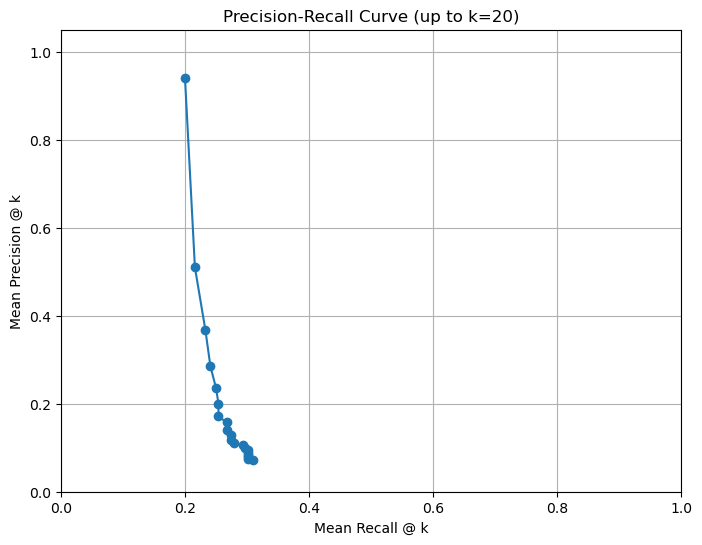


Mean Metrics @ k values saved to retrieval_metrics_summary.csv

--- Retrieval Evaluation Summary ---
Total Questions Evaluated: 50
Mean Average Precision (MAP): 0.2792
Mean Recall@1: 0.1993 | Mean Precision@1: 0.9400 | Mean Hit Rate@1: 0.9400 | Mean NDCG@1: 0.9400
Mean Recall@3: 0.2323 | Mean Precision@3: 0.3667 | Mean Hit Rate@3: 0.9800 | Mean NDCG@3: 0.4989
Mean Recall@5: 0.2493 | Mean Precision@5: 0.2360 | Mean Hit Rate@5: 0.9800 | Mean NDCG@5: 0.3985
Mean Recall@10: 0.2743 | Mean Precision@10: 0.1300 | Mean Hit Rate@10: 1.0000 | Mean NDCG@10: 0.4354
Mean Recall@20: 0.3093 | Mean Precision@20: 0.0730 | Mean Hit Rate@20: 1.0000 | Mean NDCG@20: 0.4748
Average Retrieval Latency: 0.017 seconds

--- Sample Retrieval Details (First 3 Queries) ---

Result 1:
  Question ID: Single_JKHY/2009/page_28.pdf-3
  Question: what was the percentage change in the net cash from operating activities from 2008 to 2009...
  Ground Truth Entry ID: Single_JKHY/2009/page_28.pdf-3
  Total Relevant Docs in C

In [ ]:
# %% [markdown]
# ## RAG Retrieval Evaluation (Precision, Recall, MAP, Hit Rate, NDCG, Plot)
#
# This cell evaluates the performance of the *retrieval* component of the RAG pipeline.
# It calculates:
# - Mean Precision@k
# - Mean Recall@k
# - Mean Average Precision (MAP)
# - Mean Hit Rate@k
# - Mean Normalized Discounted Cumulative Gain (NDCG)@k (using binary relevance)
# It also generates a Precision-Recall curve plot based on average values at different k
# and saves the mean metrics values to a CSV file.

# %%
# Ensure matplotlib is installed
try:
    import matplotlib.pyplot as plt
except ImportError:
    print("Matplotlib not found. Installing...")
    %pip install matplotlib
    import matplotlib.pyplot as plt

import json
import re
import time
import numpy as np
from collections import defaultdict
import hashlib # To uniquely identify chunks if needed
import csv # For saving results to CSV
import math # For log2 in NDCG

from langchain_core.vectorstores import VectorStoreRetriever # To define retriever settings
# Assuming 'chunks' list from a previous cell is available in the global scope
# If not, you'll need to load or regenerate it here.
# Example:
# markdown_file = "data/train_output.md"
# markdown_content = load_markdown_document(markdown_file) # Function from previous cell
# chunks = get_markdown_splits(markdown_content) # Function from previous cell


# --- Configuration ---
GROUND_TRUTH_FILE = "data/train.json"
EVALUATION_SAMPLE_SIZE = 50 # Number of questions to sample for evaluation (adjust as needed)
MAX_RETRIEVAL_K = 20 # Max number of documents to retrieve for calculating metrics across k
OUTPUT_CSV_FILE = "retrieval_metrics_summary.csv" # Filename for the CSV output

# --- Helper Function to Extract Entry ID from Metadata ---
def extract_entry_id_from_metadata(metadata):
    """
    Extracts the entry ID from the 'Header 1' metadata.
    Assumes header format is '# Entry: {entry_id} ({filename})'.
    """
    if not metadata or "Header 1" not in metadata:
        return None
    
    header1_content = metadata["Header 1"]
    match = re.search(r"Entry:\s*(\S+)", header1_content)
    if match:
        return match.group(1)
    return None

# --- Helper Function to Create a Unique Identifier for a Document ---
def get_doc_identifier(doc):
    """Creates a unique identifier for a Langchain Document based on its content hash."""
    return hashlib.sha256(doc.page_content.encode('utf-8')).hexdigest()

# --- Pre-computation: Map Entry IDs to Relevant Document Identifiers ---
def build_relevant_docs_map(chunks_list):
    """
    Builds a map from entry_id to a set of unique identifiers for chunks belonging to that entry.
    """
    print("Building map of relevant documents for recall calculation...")
    relevant_docs_map = defaultdict(set)
    processed_chunks = 0
    unique_doc_ids = set()
    for i, chunk in enumerate(chunks_list):
        entry_id = extract_entry_id_from_metadata(chunk.metadata)
        if entry_id:
            doc_id = get_doc_identifier(chunk)
            # Ensure doc_id is unique before adding
            if doc_id not in unique_doc_ids:
                 relevant_docs_map[entry_id].add(doc_id)
                 unique_doc_ids.add(doc_id)
                 processed_chunks += 1
            # else: # Handle potential hash collisions if necessary, unlikely with sha256
            #     print(f"Warning: Potential hash collision for chunk {i}")

        # Optional: Add progress print for large datasets
        # if (i + 1) % 1000 == 0:
        #     print(f"  Processed {i+1}/{len(chunks_list)} chunks...")
            
    print(f"Built map for {len(relevant_docs_map)} unique entry IDs from {processed_chunks} unique chunks.")
    if processed_chunks < len(chunks_list):
         print(f"Warning: {len(chunks_list) - processed_chunks} chunks could not be mapped to an entry ID or were duplicates.")
    return relevant_docs_map

# --- NDCG Calculation Helper ---
def calculate_ndcg(retrieved_ids, relevant_ids, k):
    """Calculates NDCG@k using binary relevance."""
    # Calculate DCG@k
    dcg = 0.0
    for i in range(min(k, len(retrieved_ids))):
        doc_id = retrieved_ids[i]
        if doc_id in relevant_ids:
            # Binary relevance = 1 if relevant, 0 otherwise
            relevance = 1
            # Discount factor: log base 2 of rank+1 (rank is i+1)
            discount = math.log2(i + 2) # i+2 because rank starts at 1 (i=0 -> rank 1 -> log2(2))
            dcg += relevance / discount
            
    # Calculate IDCG@k (Ideal DCG)
    idcg = 0.0
    num_relevant_to_consider = min(k, len(relevant_ids)) # Ideal ranking has relevant docs first
    for i in range(num_relevant_to_consider):
        relevance = 1 # Ideal documents have relevance 1
        discount = math.log2(i + 2)
        idcg += relevance / discount
        
    # Calculate NDCG@k
    if idcg == 0:
        return 0.0 # Avoid division by zero if no relevant docs exist or k=0
    else:
        return dcg / idcg

# --- Evaluation Function ---
def evaluate_retrieval_metrics(vector_store, relevant_docs_map, json_file_path, sample_size=10, max_k=20, output_csv_file="retrieval_metrics.csv"):
    """
    Evaluates retrieval metrics (Precision, Recall, MAP, Hit Rate, NDCG) of the RAG pipeline.
    Saves mean metrics @ k to a CSV file.

    Args:
        vector_store: The initialized FAISS vector store.
        relevant_docs_map (dict): Map from entry_id to set of relevant doc identifiers.
        json_file_path (str): Path to the JSON file containing Q&A pairs and entry IDs.
        sample_size (int): Number of questions to sample for evaluation.
        max_k (int): The max number of top documents to retrieve for evaluation.
        output_csv_file (str): Path to save the summary CSV file.

    Returns:
        dict: A dictionary containing evaluation results and metrics, or None on error.
    """
    print(f"\nStarting retrieval evaluation using {json_file_path}...")
    print(f"Calculating Precision, Recall, Hit Rate, NDCG @ k (up to k={max_k}), and MAP over {sample_size} samples.")

    # --- 1. Load Ground Truth Data ---
    try:
        with open(json_file_path, "r", encoding="utf-8") as f:
            all_data = json.load(f)
    except FileNotFoundError:
        print(f"Error: Ground truth file not found at {json_file_path}")
        return None
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from {json_file_path}")
        return None

    # Filter data
    qa_data = [
        entry for entry in all_data
        if "id" in entry and str(entry["id"]) in relevant_docs_map and "qa" in entry and "question" in entry["qa"] and entry["qa"]["question"]
    ]
    if not qa_data:
        print("Error: No valid Q&A pairs with IDs found in the data that match the relevant docs map.")
        return None

    # --- 2. Prepare Evaluation Sample ---
    actual_sample_size = min(sample_size, len(qa_data))
    if actual_sample_size < sample_size:
         print(f"Warning: Sample size reduced to {actual_sample_size} due to available data.")
    eval_sample = qa_data[:actual_sample_size]
    print(f"Evaluating on {len(eval_sample)} Q&A pairs...")

    # --- 3. Define Evaluation Retriever ---
    try:
        eval_retriever = vector_store.as_retriever(search_kwargs={'k': max_k})
    except Exception as e:
        print(f"Error creating retriever: {e}")
        return None

    # --- 4. Run Retrieval and Calculate Metrics ---
    all_precisions_at_k = defaultdict(list)
    all_recalls_at_k = defaultdict(list)
    all_hit_rates_at_k = defaultdict(list) # Store Hit Rate @ k
    all_ndcg_at_k = defaultdict(list)      # Store NDCG @ k
    average_precisions = []
    retrieval_latencies = []
    results_details = []

    for i, item in enumerate(eval_sample):
        question = item["qa"]["question"]
        ground_truth_entry_id = str(item["id"])
        relevant_doc_ids = relevant_docs_map.get(ground_truth_entry_id, set())
        num_relevant_docs_total = len(relevant_doc_ids)

        if num_relevant_docs_total == 0:
             continue

        start_time = time.time()
        try:
            retrieved_docs = eval_retriever.invoke(question)
        except Exception as e:
            print(f"Error during retrieval for question '{question[:50]}...': {e}")
            retrieved_docs = []
        end_time = time.time()
        retrieval_latencies.append(end_time - start_time)

        retrieved_doc_ids = [get_doc_identifier(doc) for doc in retrieved_docs]
        
        precision_sum_for_ap = 0.0
        query_precisions = {}
        query_recalls = {}
        query_hit_rates = {}
        query_ndcgs = {}
        
        # Calculate metrics for each k up to max_k or retrieved length
        num_retrieved = len(retrieved_doc_ids)
        for k in range(1, max_k + 1):
            if k > num_retrieved: # Don't calculate for k beyond retrieved count
                 # Store NaN or 0, or simply skip? Let's store last valid value or 0
                 # For simplicity, we'll just calculate up to num_retrieved
                 continue 

            current_retrieved_set = set(retrieved_doc_ids[:k])
            relevant_retrieved_at_k_set = relevant_doc_ids.intersection(current_retrieved_set)
            num_relevant_retrieved_at_k = len(relevant_retrieved_at_k_set)

            # Precision@k
            precision_at_k = num_relevant_retrieved_at_k / k
            all_precisions_at_k[k].append(precision_at_k)
            query_precisions[k] = precision_at_k

            # Recall@k
            recall_at_k = num_relevant_retrieved_at_k / num_relevant_docs_total
            all_recalls_at_k[k].append(recall_at_k)
            query_recalls[k] = recall_at_k
            
            # Hit Rate@k
            hit_rate_at_k = 1.0 if num_relevant_retrieved_at_k > 0 else 0.0
            all_hit_rates_at_k[k].append(hit_rate_at_k)
            query_hit_rates[k] = hit_rate_at_k
            
            # NDCG@k
            ndcg_at_k = calculate_ndcg(retrieved_doc_ids, relevant_doc_ids, k)
            all_ndcg_at_k[k].append(ndcg_at_k)
            query_ndcgs[k] = ndcg_at_k

            # Accumulate for Average Precision (AP)
            if k <= num_retrieved and retrieved_doc_ids[k-1] in relevant_doc_ids:
                 precision_sum_for_ap += precision_at_k

        # Calculate Average Precision (AP) for this query
        average_precision_query = precision_sum_for_ap / num_relevant_docs_total if num_relevant_docs_total > 0 else 0.0
        average_precisions.append(average_precision_query)

        # Store detailed results
        final_relevant_count = len(relevant_doc_ids.intersection(set(retrieved_doc_ids)))
        results_details.append({
            "question_id": item.get("id", "N/A"),
            "question": question,
            "ground_truth_entry_id": ground_truth_entry_id,
            "num_total_relevant": num_relevant_docs_total,
            "retrieved_ids_preview": retrieved_doc_ids[:5],
            "num_relevant_retrieved_total": final_relevant_count,
            "average_precision": average_precision_query,
            "precisions_at_k": query_precisions,
            "recalls_at_k": query_recalls,
            "hit_rates_at_k": query_hit_rates, # Store query-level hit rates
            "ndcgs_at_k": query_ndcgs,         # Store query-level NDCGs
            "retrieval_latency": round(end_time - start_time, 3)
        })
        
        if (i + 1) % 10 == 0 or (i+1) == len(eval_sample):
             print(f"  Processed {i+1}/{len(eval_sample)} queries...")


    # --- 5. Calculate Overall Mean Metrics ---
    mean_average_precision = np.mean(average_precisions) if average_precisions else 0.0
    mean_retrieval_latency = np.mean(retrieval_latencies) if retrieval_latencies else 0.0

    mean_precisions_map = {}
    mean_recalls_map = {}
    mean_hit_rates_map = {} # Store mean Hit Rate @ k
    mean_ndcgs_map = {}     # Store mean NDCG @ k
    
    # Use keys from one dict, assuming they are calculated consistently up to max_k
    k_values = sorted(all_precisions_at_k.keys()) 

    for k in k_values:
        mean_precisions_map[k] = np.mean(all_precisions_at_k[k]) if k in all_precisions_at_k else 0
        mean_recalls_map[k] = np.mean(all_recalls_at_k[k]) if k in all_recalls_at_k else 0
        mean_hit_rates_map[k] = np.mean(all_hit_rates_at_k[k]) if k in all_hit_rates_at_k else 0
        mean_ndcgs_map[k] = np.mean(all_ndcg_at_k[k]) if k in all_ndcg_at_k else 0

    # --- 6. Plot Precision-Recall Curve ---
    plot_mean_recalls = [mean_recalls_map[k] for k in k_values]
    plot_mean_precisions = [mean_precisions_map[k] for k in k_values]

    plt.figure(figsize=(8, 6))
    plt.plot(plot_mean_recalls, plot_mean_precisions, marker='o', linestyle='-')
    plt.xlabel('Mean Recall @ k')
    plt.ylabel('Mean Precision @ k')
    plt.title(f'Precision-Recall Curve (up to k={max_k})')
    plt.grid(True)
    # Adjust xlim based on max recall achieved, ensure it goes up to 1.0
    plt.xlim([0.0, max(plot_mean_recalls + [1.0])]) 
    plt.ylim([0.0, 1.05])
    plt.show()

    # --- 7. Save Summary Metrics to CSV ---
    try:
        with open(output_csv_file, 'w', newline='', encoding='utf-8') as csvfile:
            # Add new metric columns to fieldnames
            fieldnames = ['k', 'mean_precision_at_k', 'mean_recall_at_k', 'mean_hit_rate_at_k', 'mean_ndcg_at_k']
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

            writer.writeheader()
            for k in k_values:
                writer.writerow({
                    'k': k,
                    'mean_precision_at_k': mean_precisions_map[k],
                    'mean_recall_at_k': mean_recalls_map[k],
                    'mean_hit_rate_at_k': mean_hit_rates_map[k], # Write hit rate
                    'mean_ndcg_at_k': mean_ndcgs_map[k]          # Write NDCG
                })
        print(f"\nMean Metrics @ k values saved to {output_csv_file}")
    except IOError as e:
        print(f"\nError saving metrics to CSV file {output_csv_file}: {e}")
    except Exception as e:
        print(f"\nAn unexpected error occurred while saving to CSV: {e}")


    # --- 8. Print Summary ---
    print("\n--- Retrieval Evaluation Summary ---")
    print(f"Total Questions Evaluated: {len(eval_sample)}")
    print(f"Mean Average Precision (MAP): {mean_average_precision:.4f}")
    # Print Mean metrics at specific k values for reference
    k_summary_points = [1, 3, 5, 10, max_k]
    for k_val in k_summary_points:
         if k_val in k_values:
             print(f"Mean Recall@{k_val}: {mean_recalls_map.get(k_val, 0):.4f}", end=" | ")
             print(f"Mean Precision@{k_val}: {mean_precisions_map.get(k_val, 0):.4f}", end=" | ")
             print(f"Mean Hit Rate@{k_val}: {mean_hit_rates_map.get(k_val, 0):.4f}", end=" | ")
             print(f"Mean NDCG@{k_val}: {mean_ndcgs_map.get(k_val, 0):.4f}")
         elif k_val <= max_k:
              print(f"Metrics@{k_val}: Not calculated (check MAX_RETRIEVAL_K or retrieved results count)")


    print(f"Average Retrieval Latency: {mean_retrieval_latency:.3f} seconds")


    return {
        "mean_average_precision": mean_average_precision,
        "mean_recall_at_k": mean_recalls_map,
        "mean_precision_at_k": mean_precisions_map,
        "mean_hit_rate_at_k": mean_hit_rates_map, # Add to return dict
        "mean_ndcg_at_k": mean_ndcgs_map,         # Add to return dict
        "k_values_for_plot": k_values,
        "plot_mean_recalls": plot_mean_recalls,
        "plot_mean_precisions": plot_mean_precisions,
        "average_latency": mean_retrieval_latency,
        "results_details": results_details # Contains detailed metrics per query, including new ones
    }

# --- Run the Evaluation ---

# Ensure 'vector_store' and 'chunks' are defined from previous cells
if 'vector_store' in locals() or 'vector_store' in globals():
    if 'chunks' in locals() or 'chunks' in globals():
        # Build the map of relevant documents first
        relevant_docs_map = build_relevant_docs_map(chunks)

        # Run the evaluation
        retrieval_evaluation_results = evaluate_retrieval_metrics(
            vector_store,
            relevant_docs_map,
            GROUND_TRUTH_FILE,
            sample_size=EVALUATION_SAMPLE_SIZE,
            max_k=MAX_RETRIEVAL_K,
            output_csv_file=OUTPUT_CSV_FILE # Pass the filename
        )

        # Optional: Print details of the first few retrieval results
        if retrieval_evaluation_results and retrieval_evaluation_results["results_details"]:
            print("\n--- Sample Retrieval Details (First 3 Queries) ---")
            for i, result in enumerate(retrieval_evaluation_results["results_details"][:3]):
                print(f"\nResult {i+1}:")
                print(f"  Question ID: {result['question_id']}")
                print(f"  Question: {result['question'][:100]}...")
                print(f"  Ground Truth Entry ID: {result['ground_truth_entry_id']}")
                print(f"  Total Relevant Docs in Corpus: {result['num_total_relevant']}")
                print(f"  Retrieved IDs Preview: {result['retrieved_ids_preview']}")
                print(f"  Relevant Retrieved (up to k={MAX_RETRIEVAL_K}): {result['num_relevant_retrieved_total']}")
                print(f"  Average Precision (AP): {result['average_precision']:.4f}")
                # Example: print P@5, R@5, HR@5, NDCG@5 if available
                k_disp = 5
                p_at_k = result['precisions_at_k'].get(k_disp, 'N/A')
                r_at_k = result['recalls_at_k'].get(k_disp, 'N/A')
                hr_at_k = result['hit_rates_at_k'].get(k_disp, 'N/A')
                ndcg_at_k = result['ndcgs_at_k'].get(k_disp, 'N/A')
                print(f"  Metrics @{k_disp}:")
                print(f"    Precision: {p_at_k if p_at_k == 'N/A' else f'{p_at_k:.2f}'}")
                print(f"    Recall:    {r_at_k if r_at_k == 'N/A' else f'{r_at_k:.2f}'}")
                print(f"    Hit Rate:  {hr_at_k if hr_at_k == 'N/A' else f'{hr_at_k:.2f}'}")
                print(f"    NDCG:      {ndcg_at_k if ndcg_at_k == 'N/A' else f'{ndcg_at_k:.4f}'}")
                print(f"  Latency: {result['retrieval_latency']:.3f}s")
    else:
         print("\nError: 'chunks' list not found. Please ensure it is defined from a previous cell.")
else:
    print("\nError: 'vector_store' not found. Please ensure it is defined in a previous cell.")


